In [5]:
# !pip install plotly nbformat

In [3]:
# import
import os
import plotly.graph_objects as go
import plotly.express as px

# frontend
import numpy as np
from spatialmath import *
import cv2
import matplotlib.pyplot as plt

# backend
import gtsam
from gtsam.symbol_shorthand import L, X

# our slam implementation
from minslam.data_loader import TartanAirLoader
from minslam.frontend import Frontend
from minslam.params import Params
from minslam.backend import Backend
from minslam.camera import PinholeCamera

--- Added keyframe 0 (seq id: 100) ---
current point number: 0
extracting more features: 200
--- Added keyframe 1 (seq id: 104) ---
current point number: 176
extracting more features: 24
measurement1:  [520.5643310546875, 129.90220642089844, 12.9609375]
measurement2:  [499.2407, 122.76886, 13.1796875]
point_world1:  [ 1.43438369 -5.95714229 -8.87578604]
point_world2:  [ 1.42564679 -5.95133406 -8.87190198]
dlt_estimate:  [ 1.29741814 -5.90663136 -8.76209075]
DLT estimation error: 0.1850


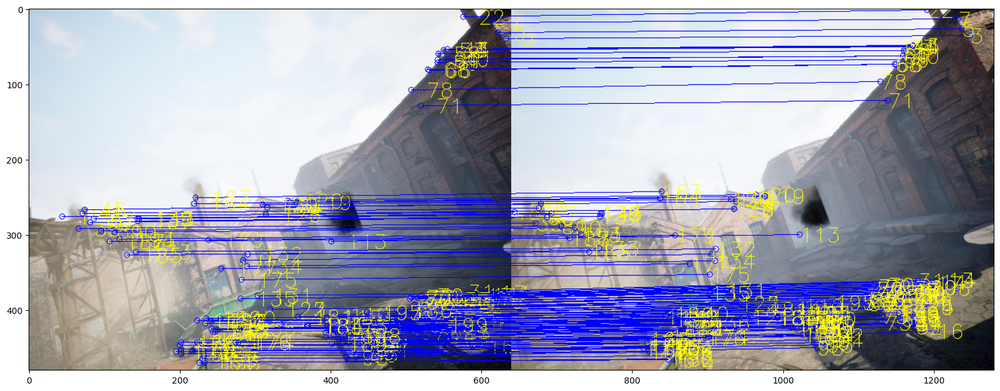

In [10]:
# minslam camera vs gtsam camera

# load a trajectory
dataset = TartanAirLoader('../data/P006/')
dataset.load_ground_truth()
dataset.set_odometry(dataset.gt)
dataset.set_curr_index(100)

# load the dataset
params = Params('../params/tartanair.yaml')
# params['frontend']['keyframe']['threshold'] = 0.
frontend = Frontend(params)
backend = Backend(params)

# get results from frontend
def run_frontend_once(frontend):
    pose = dataset.read_current_ground_truth()
    while not frontend.keyframe_selection(pose):
        if not dataset.load_next_frame():
            break
        pose = dataset.read_current_ground_truth()
    color, depth = dataset.read_current_rgbd()
    frontend.add_keyframe(pose, color, depth, dataset.curr_index)
    print(f'--- Added keyframe {frontend.frame_id} (seq id: {dataset.curr_index}) ---')
    if frontend.frame_id > 0:
        frontend.match_features()
        frontend.eliminate_outliers()
    more_points_n = params['frontend']['feature']['number']-len(frontend.curr_frame.points)
    print('current point number:', len(frontend.curr_frame.points))
    if more_points_n>0:
        print('extracting more features:', more_points_n)
        frontend.extract_features(more_points_n, append_mode=True)
    frontend.assign_global_id()
    # frontend.plot_matches(with_global_id=True)
    return frontend.curr_frame

# get two frames
frontend_frame1 = run_frontend_once(frontend)
frontend_frame2 = run_frontend_once(frontend)

plt.figure(figsize=(20,10))
im = frontend.plot_matches(with_global_id=True)

# get one landmark that is visible in both frames
for l1 in frontend_frame1.landmarks:
    landmark_id = -1
    for l2 in frontend_frame2.landmarks:
        if l1.global_id==l2.global_id:
            landmark_id = l1.global_id
            break
    if landmark_id!=-1:
        break

for l1 in frontend_frame1.landmarks:
    if l1.global_id==71:
        break

landmark = l1

# get the measurements
measurement1 = landmark.measurements[frontend_frame1.frame_id]
measurement2 = landmark.measurements[frontend_frame2.frame_id]
print('measurement1: ', measurement1)
print('measurement2: ', measurement2)

# use min-slam camera
camera = PinholeCamera(params)
pose0 = frontend_frame1.odom_pose
pose1 = frontend_frame1.odom_pose
pose2 = frontend_frame2.odom_pose
point = camera.back_project(*measurement1, pose1).flatten()
print('point_world1: ',camera.back_project(*measurement1, pose1).flatten())
# print('point_cam1: ', camera.back_project2(*measurement1).flatten())
print('point_world2: ',camera.back_project(*measurement2, pose2).flatten())
# print('point_cam2: ', camera.back_project2(*measurement2).flatten())

# use gtsam camera
fx, fy, cx, cy = camera.camera_matrix
K = gtsam.Cal3_S2(fx, fy, 0.0, cx, cy)
pose_gtsam1 = gtsam.Pose3(gtsam.Rot3(pose1.R),gtsam.Point3(*pose1.t))
pose_gtsam2 = gtsam.Pose3(gtsam.Rot3(pose2.R),gtsam.Point3(*pose2.t))
gtsam_camera1 = gtsam.PinholeCameraCal3_S2(pose_gtsam1, K)
gtsam_camera2 = gtsam.PinholeCameraCal3_S2(pose_gtsam2, K)
gtsam_cameras = gtsam.CameraSetCal3_S2([gtsam_camera1, gtsam_camera2])
measurements = gtsam.Point2Vector([gtsam.Point2(*(measurement1[:2])), gtsam.Point2(*(measurement2[:2]))])

dlt_estimate = gtsam.triangulatePoint3(gtsam_cameras, measurements, rank_tol=1e-9, optimize=False)
print('dlt_estimate: ', dlt_estimate)
print("DLT estimation error: {:.04f}".format(np.linalg.norm(dlt_estimate - point)))

In [36]:
# plot the camera

import plotly.graph_objects as go
import numpy as np
from scipy.spatial.transform import Rotation

def plot_camera(fig, rotation_matrix, translation_vector, focal_length, legend_name, show_legend):
    # Define the camera center
    center = translation_vector

    # Calculate the camera frame size based on the focal length
    frame_width = 2 * focal_length
    frame_height = 2 * focal_length

    # Calculate the corner points of the camera frame
    corner_points = [
        center + rotation_matrix @ np.array([frame_width / 2, frame_height / 2, focal_length]),
        center + rotation_matrix @ np.array([-frame_width / 2, frame_height / 2, focal_length]),
        center + rotation_matrix @ np.array([-frame_width / 2, -frame_height / 2, focal_length]),
        center + rotation_matrix @ np.array([frame_width / 2, -frame_height / 2, focal_length])
    ]

    # Add the camera frame as lines
    fig.add_trace(go.Scatter3d(
        x=[corner_points[0][0], corner_points[1][0], corner_points[2][0], corner_points[3][0], corner_points[0][0]],
        y=[corner_points[0][1], corner_points[1][1], corner_points[2][1], corner_points[3][1], corner_points[0][1]],
        z=[corner_points[0][2], corner_points[1][2], corner_points[2][2], corner_points[3][2], corner_points[0][2]],
        mode='lines',
        line=dict(color='blue', width=2),
        legendgroup=legend_name,
        name=legend_name,
        showlegend=show_legend
    ))

    # Connect the corners to the camera center
    for point in corner_points:
        fig.add_trace(go.Scatter3d(
            x=[point[0], center[0]],
            y=[point[1], center[1]],
            z=[point[2], center[2]],
            mode='lines',
            line=dict(color='blue', width=2),
            legendgroup=legend_name,
            name='',
            showlegend=False
        ))

def plot_point(fig, point, legend_name):
    fig.add_trace(go.Scatter3d(
        x=[point[0]],
        y=[point[1]],
        z=[point[2]],
        mode='markers',
        marker=dict(size=5, color='red'),
        name=legend_name
    ))

def plot_ray_from_camera(fig, camera_pose, focal_length, point, legend_name):
    # Extract camera center and rotation matrix from the camera pose
    center = camera_pose[:3]
    rotation_matrix = camera_pose[3:]

    # Calculate the direction vector from the camera center to the point
    direction = point - center

    # Normalize the direction vector
    direction = direction / np.linalg.norm(direction)

    # Calculate the end point of the ray using the focal length
    ray_end = center + direction * focal_length

    # Add the ray as a line segment
    fig.add_trace(go.Scatter3d(
        x=[center[0], ray_end[0]],
        y=[center[1], ray_end[1]],
        z=[center[2], ray_end[2]],
        mode='lines',
        line=dict(color='green', width=2),
        legendgroup=legend_name,
        name=legend_name
    ))

In [92]:
rotation_matrices = [
    pose1.R,
    pose2.R
]

translation_vectors = [
    pose1.t,
    pose2.t
]
# Create a 3D plot
fig = go.Figure()

# Plot the cameras
for i in range(len(rotation_matrices)):
    plot_camera(fig, rotation_matrices[i], translation_vectors[i], 15, f'Camera {i+1}', True)
    plot_ray_from_camera
# Set the layout of the plot
fig.update_layout(
    scene=dict(
        aspectmode='data',
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    )
)

plot_point(fig, point, 'point')
plot_point(fig, dlt_estimate, 'dlt')

# Show the plot
fig.show()

In [55]:
#plot depth image

# depth_image = dataset.read_current_rgbd()[1]
depth_image = np.load('/home/link/Projects/minimum-slam/data/P006/depth_left/000100_left_depth.npy')

depth_image = depth_image.clip(0, 25)
width, height = depth_image.shape
x = np.arange(width)
y = np.arange(height)
X, Y = np.meshgrid(x, y)

# Create the surface plot
fig = go.Figure(data=go.Surface(x=X, y=Y, z=depth_image))

# Customize the plot layout if needed
fig.update_layout(
    title="Depth Image",
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Depth',
    )
)

# Display the plot
fig.show()

In [1]:
# gtsam example

import gtsam
import numpy as np
from gtsam import Pose3, Rot3, Point3

# Define parameters for 2 cameras, with shared intrinsics.
pose1 = Pose3()
pose2 = Pose3(Rot3(), Point3(5., 0., -5.))
intrinsics = K
camera1 = gtsam.PinholeCameraCal3_S2(pose1, intrinsics)
camera2 = gtsam.PinholeCameraCal3_S2(pose2, intrinsics)
cameras = gtsam.CameraSetCal3_S2([camera1, camera2])

# Define a 3D point, generate measurements by projecting it to the 
# cameras and adding some noise.
landmark = Point3(0.1, 0.1, 1.5)
m1_noisy = cameras[0].project(landmark)
m2_noisy = cameras[1].project(landmark)
measurements = gtsam.Point2Vector([m1_noisy, m2_noisy])

print("m1_noisy: ", m1_noisy)
print("m2_noisy: ", m2_noisy)

# Triangulate!
dlt_estimate = gtsam.triangulatePoint3(cameras, measurements, rank_tol=1e-9, optimize=False)
print("DLT estimation error: {:.04f}".format(np.linalg.norm(dlt_estimate - landmark)))

NameError: name 'K' is not defined

In [11]:
pose = SE3()
measurement = [78.76923077, 244.92307692]
pose.t = np.array([5,0,-5])
point = np.array([0.1, 0.1, 1.5])
# depth = np.linalg.norm(point-pose.t)
depth = 6.5
camera.back_project2(*measurement, depth),camera.back_project(*measurement, depth,pose),camera.project(point,pose)

(array([-4.9,  0.1,  6.5]),
 array([[0.1],
        [0.1],
        [1.5]]),
 (array([78.76923077]), array([244.92307692]), array([6.5])))

In [6]:
pose = SE3()
measurement = [341.33333333, 261.33333333]
pose.t = np.array([0,0,0])
point = np.array([0.1, 0.1, 1.5])
depth = np.linalg.norm(point-pose.t)
camera.back_project2(*measurement, depth),camera.back_project(*measurement, depth,pose),camera.project(point,pose)

(array([0.10044346, 0.10044346, 1.50665192]),
 array([[0.10044346],
        [0.10044346],
        [1.50665192]]),
 (array([341.33333333]), array([261.33333333]), array([1.5])))

In [4]:
# gtsam example with different rotation

import gtsam
import numpy as np
from gtsam import Pose3, Rot3, Point3

rot = np.array([[-0.05751039, -0.94992784,  0.30713134],
       [ 0.97797864,  0.00821769,  0.20854316],
       [-0.20062486,  0.31236129,  0.92853653]])

# Define parameters for 2 cameras, with shared intrinsics.
rot_gtsam = gtsam.Rot3(rot)
pose1 = Pose3(rot_gtsam, Point3(0,0,0))
pose2 = Pose3(rot_gtsam, Point3(5., 0., -5.))
intrinsics = K
camera1 = gtsam.PinholeCameraCal3_S2(pose1, intrinsics)
camera2 = gtsam.PinholeCameraCal3_S2(pose2, intrinsics)
cameras = gtsam.CameraSetCal3_S2([camera1, camera2])

# Define a 3D point, generate measurements by projecting it to the 
# cameras and adding some noise.
landmark = Point3(2,1,10)
m1_noisy = cameras[0].project(landmark)
m2_noisy = cameras[1].project(landmark)
measurements = gtsam.Point2Vector([m1_noisy, m2_noisy])

print("m1_noisy: ", m1_noisy)
print("m2_noisy: ", m2_noisy)

# Triangulate!
dlt_estimate = gtsam.triangulatePoint3(cameras, measurements, rank_tol=1e-9, optimize=False)
print("DLT estimation: ", dlt_estimate)
print("DLT estimation error: {:.04f}".format(np.linalg.norm(dlt_estimate - landmark)))


m1_noisy:  [283.80620869 279.00131544]
m2_noisy:  [274.98847389 422.66050538]
DLT estimation:  [ 2.  1. 10.]
DLT estimation error: 0.0000


In [44]:
pose = SE3(SO3(rot, check=False))
measurement = [283.80620869, 279.00131544]
point = np.array([2,1,10])
depth = (pose.inv()*point)[2]
depth,camera.back_project2(*measurement, depth),camera.back_project(*measurement, depth,pose),camera.project(point,pose)

(array([10.10817114]),
 array([[-1.14329074],
        [ 1.23197491],
        [10.10817114]]),
 array([[1.99999998],
        [1.00000002],
        [9.99999997]]),
 (array([283.80620869]), array([279.00131544]), array([10.10817114])))

In [43]:
pose = SE3(SO3(rot, check=False))
pose.t = np.array([5,0,-5])
measurement = [274.98847389, 422.66050538]
point = np.array([2,1,10])
depth = (pose.inv()*point)[2]
depth,camera.back_project2(*measurement, depth),camera.back_project(*measurement, depth,pose),camera.project(point,pose)

(array([13.21519709]),
 array([[-1.85886309],
        [ 7.54342056],
        [13.21519709]]),
 array([[1.99999993],
        [1.00000006],
        [9.99999997]]),
 (array([274.98847389]), array([422.66050538]), array([13.21519709])))

In [52]:
# gtsam example with tartanair data

import gtsam
import numpy as np
from gtsam import Pose3, Rot3, Point3

# Define parameters for 2 cameras, with shared intrinsics.
pose_gtsam1 = gtsam.Pose3(gtsam.Rot3(pose1.R),gtsam.Point3(pose1.t))
pose_gtsam2 = gtsam.Pose3(gtsam.Rot3(pose2.R),gtsam.Point3(pose2.t))
camera1 = gtsam.PinholeCameraCal3_S2(pose_gtsam1, K)
camera2 = gtsam.PinholeCameraCal3_S2(pose_gtsam2, K)
cameras = gtsam.CameraSetCal3_S2([camera1, camera2])

# Define a 3D point, generate measurements by projecting it to the 
# cameras and adding some noise.
landmark = Point3(2.0680912, 1.78549601, 5.59136812)
m1_noisy = cameras[0].project(landmark)
m2_noisy = cameras[1].project(landmark)
measurements = gtsam.Point2Vector([m1_noisy, m2_noisy])

print("m1_noisy: ", m1_noisy)
print("m2_noisy: ", m2_noisy)

# Triangulate!
dlt_estimate = gtsam.triangulatePoint3(cameras, measurements, rank_tol=1e-9, optimize=False)
print("DLT estimation: ", dlt_estimate)
print("DLT estimation error: {:.04f}".format(np.linalg.norm(dlt_estimate - landmark)))


m1_noisy:  [228.65887448 448.81628418]
m2_noisy:  [106.66729349 359.91521908]
DLT estimation:  [2.0680912  1.78549601 5.59136812]
DLT estimation error: 0.0000


In [48]:
pose = pose1
measurement = m1_noisy
point = landmark
depth = (pose.inv()*point)[2]
depth,camera.back_project2(*measurement, depth),camera.back_project(*measurement, depth,pose),camera.project(point,pose)

(array([11.1953125]),
 array([[-3.19560139],
        [ 7.30551112],
        [11.1953125 ]]),
 array([[2.0680912 ],
        [1.78549601],
        [5.59136812]]),
 (array([228.65887448]), array([448.81628418]), array([11.1953125])))

In [49]:
pose = pose2
measurement = m2_noisy
point = landmark
depth = (pose.inv()*point)[2]
depth,camera.back_project2(*measurement, depth),camera.back_project(*measurement, depth,pose),camera.project(point,pose)

(array([10.24710022]),
 array([[-6.83138008],
        [ 3.83994771],
        [10.24710022]]),
 array([[2.0680912 ],
        [1.78549601],
        [5.59136812]]),
 (array([106.66729349]), array([359.91521908]), array([10.24710022])))

In [9]:
pose1, pose2

(  -0.05751  -0.9499    0.3071    0.9559    
   0.978     0.008218  0.2085   -10.38     
  -0.2006    0.3124    0.9285   -1.754     
   0         0         0         1         
,
   -0.3184   -0.8659    0.3857    1.458     
   0.9235   -0.3751   -0.07973  -9.652     
   0.2137    0.3309    0.9192   -1.674     
   0         0         0         1         
)

In [19]:
1.854370832443237305e-01,7.768007367849349976e-02,8.081940412521362305e-01,5.535352230072021484e-01

(0.18543708324432373,
 0.0776800736784935,
 0.8081940412521362,
 0.5535352230072021)

In [45]:
rotation_matrices = [
    rot,
    rot
]

translation_vectors = [
    np.zeros(3),
    np.array([5,0,-5])
]
# Create a 3D plot
fig = go.Figure()

# Plot the cameras
for i in range(len(rotation_matrices)):
    plot_camera(fig, rotation_matrices[i], translation_vectors[i], 15, f'Camera {i+1}', True)
    plot_ray_from_camera
# Set the layout of the plot
fig.update_layout(
    scene=dict(
        aspectmode='data',
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    )
)

plot_point(fig, landmark, 'point')
# plot_point(fig, dlt_estimate, 'dlt_estimate')

# Show the plot
fig.show()

In [73]:
0.1*320/1.5+320, 0.1*320/1.5+240

(341.3333333333333, 261.3333333333333)

In [ ]:


new_traj = []
traj_ses = tf.pos_quats2SE_matrices(np.array(traj))

for tt in traj_ses:
    ttt=T.dot(tt).dot(T_inv)
    new_traj.append(tf.SE2pos_quat(ttt))
    
return np.array(new_traj)

In [4]:
dataset.dataset_folder

'../data/P006/'

In [43]:
for i, t in enumerate(gt_poses.data):
    gt_poses[i] = SE3(T.dot(t).dot(T_inv))


In [36]:
gt_poses.data[0] @ gt_poses.data[1] @ gt_poses.data[2]

array([[ -0.30961851,  -0.10421439,  -0.94513266,  17.80125089],
       [  0.08679626,   0.98672845,  -0.13723474, -82.253686  ],
       [  0.94689112,  -0.12452439,  -0.29646397,   2.38221492],
       [  0.        ,   0.        ,   0.        ,   1.        ]])

In [37]:
gt_poses.data[0].dot(gt_poses.data[1]).dot(gt_poses.data[2])

array([[ -0.30961851,  -0.10421439,  -0.94513266,  17.80125089],
       [  0.08679626,   0.98672845,  -0.13723474, -82.253686  ],
       [  0.94689112,  -0.12452439,  -0.29646397,   2.38221492],
       [  0.        ,   0.        ,   0.        ,   1.        ]])

In [41]:
gt_poses[0].data = gt_poses[100].data

In [11]:
x=SE3([SE3(),SE3(),SE3()])
x

0:
   1         0         0         0         
   0         1         0         0         
   0         0         1         0         
   0         0         0         1         
1:
   1         0         0         0         
   0         1         0         0         
   0         0         1         0         
   0         0         0         1         
2:
   1         0         0         0         
   0         1         0         0         
   0         0         1         0         
   0         0         0         1         
